<a href="https://colab.research.google.com/github/valerialrc/ufv/blob/main/ELT576/ELT576_AtividadePratica4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ELT 576 - Processamento Inteligente de Sinais
#### Professores: Leonardo B. Felix e Rodolpho V. A. Neves
## Curso de Especialização em Inteligência Computacional e Artificial
## Desafio da Semana 4

## Filtragem espectral

### Tutorial 1: Recuperação de sinal de interesse meio a ruído


Os filtros digitais podem ser usados para extrair informação útil em meio de ruído. Isso também pode ser visto como uma forma de realçar uma informação - no caso espectral - em detrimento de outras. Vamos inicialmente criar uma senóide e vamos chama-la de "sinal de interesse".


In [ ]:
# bibliotecas importantes para o Roteiro
from matplotlib import pyplot as plt
from scipy import signal

import numpy as np

In [ ]:
fs = 2048
t = np.arange(0,5+1/fs,1/fs) # como o arquivo foi feito em matlab, vamos adicionar mais um elemento no vetor
s = np.sin(2*np.pi*262*t)

O sinal de interesse, contido na variável s, possui amplitude 1 e frequência 262 Hz. Note que a frequência de amostragem está de acordo com o teorema da amostragem. Dê uma olhada nos instantes iniciais desse sinal.

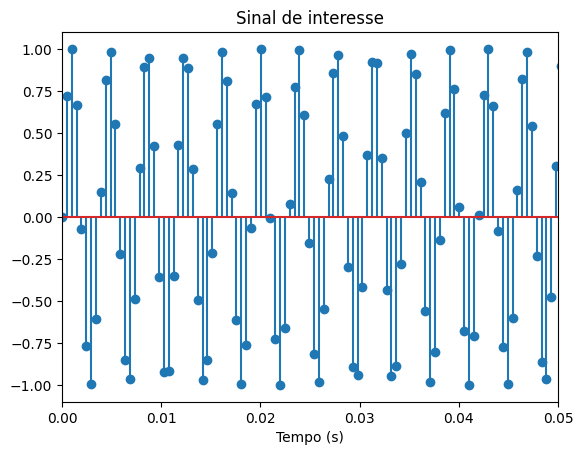

In [ ]:
plt.figure()
plt.stem(t,s)
plt.title('Sinal de interesse')
plt.xlabel('Tempo (s)')
plt.xlim(0,.05)
plt.show()

Normalmente os sinais de interesse são coletados imersos em ruído. Vamos simular essa situação adicionando um ruído do tipo gaussiano ao sinal de interesse. Note a amplitude bem mais elevada da mistura sinal+ruído quando comparada apenas ao sinal.

In [ ]:
# carregando o arquivo ruido.txt do github

user = "nias-ufv"
repo = "elt576-processamento-inteligente-sinais"
diretorio = "semana-4"
arquivo = "ruido.txt"

url = f"https://raw.githubusercontent.com/{user}/{repo}/main/{diretorio}/{arquivo}"
!wget --no-cache --backups=1 {url}

print(f"Arquivo {arquivo} carregado com sucesso! Confira o diretório de trabalho atual.")

--2025-02-06 23:43:45--  https://raw.githubusercontent.com/nias-ufv/elt576-processamento-inteligente-sinais/main/semana-4/ruido.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 158738 (155K) [text/plain]
Saving to: ‘ruido.txt’

ruido.txt           100%[===================>] 155.02K  --.-KB/s    in 0.02s   

2025-02-06 23:43:45 (6.30 MB/s) - ‘ruido.txt’ saved [158738/158738]

Arquivo ruido.txt carregado com sucesso! Confira o diretório de trabalho atual.


In [ ]:
# lendo o arquivo ruido.txt
with open("ruido.txt", "r", encoding="utf-8-sig") as arquivo:
    ruido_txt = arquivo.read()
    ruidos = ruido_txt.split()
    ruido = [float(ruido) for ruido in ruidos]

In [ ]:
# adicionando o ruido ao sinal de interesse
x = s + ruido

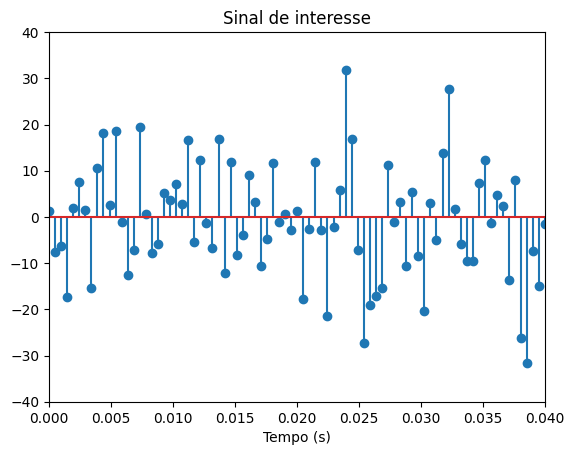

In [ ]:
# plot do sinal
plt.figure()
plt.stem(t,x) # sinal com ruido
#plt.stem(t,s, linefmt=':') # sinal de interesse
plt.title('Sinal de interesse')
plt.xlabel('Tempo (s)')
plt.xlim(0,.04)
plt.ylim(-40,40)
plt.show()

In [ ]:
# biblioteca para tocar audio no python (Google Colab)
from IPython.display import Audio

# tocando o som
Audio(s,rate=3000)

In [ ]:
# tocando o som
Audio(x,rate=3000)

Vejamos o espectro do sinal+ruído. Vamos usar o comando _welch_, da biblioteca _signal_, o qual executa internamente o algoritmo da trasnformada de Fourier e tem várias opções (- dê um help em signal.welch e confira). Note que o espectro do sinal de interesse está acompanhado de ruídos em todas as faixas de frequências possíveis nesse caso.

In [ ]:
nperseg = 1024
overlap = 0.5
f, Pxx_den = signal.welch(x, fs,  nperseg=nperseg, noverlap=np.uint8(np.round(nperseg*overlap)))
f0, Pxx_den0 = signal.welch(s, fs,  nperseg=nperseg, noverlap=np.uint8(np.round(nperseg*overlap)))

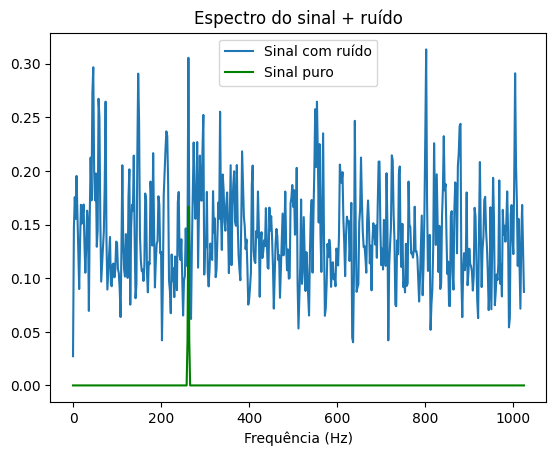

In [ ]:
plt.figure()
plt.plot(f,Pxx_den, label='Sinal com ruído')
plt.plot(f0,Pxx_den0, 'g', label='Sinal puro')
plt.title('Espectro do sinal + ruído')
plt.xlabel('Frequência (Hz)')
plt.legend()
plt.show()

Nos interessa aqui extrair apenas a informação contida na frequência do sinal de
interesse. Assim, projetaremos um filtro digital passa-faixa, com frequência de centro igual à frequência do sinal de interesse. Neste exemplo, projetaremos um filtro do tipo butterworth de quarta ordem. Note que as frequências de projeto são ponderadas por metade do valor da
frequência de amostragem.

In [ ]:
# configuracao dos parametros do filtro butterworth
f1 = 260
f2 = 264

n = 4

# ajustando o filtro butterworth de ordem n e banda de passagem f1 e f2
# "b": numerador
# "a": denominador
b, a = signal.butter(n, [f1, f2], btype='bandpass', output='ba', fs=fs)

<ipython-input-76-f064dcf47a33>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].plot(w, 20 * np.log10(abs(h)), label=f'n={n}')


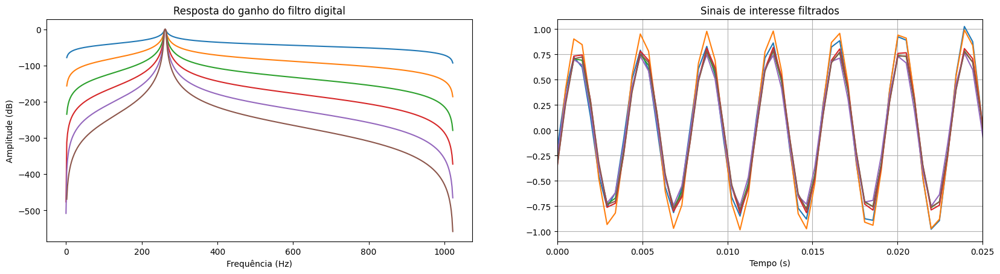

In [ ]:
# efeito da ordem do filtro na resposta do ganho por frequencia

# configuracao dos parametros do filtro butterworth
f1 = 260
f2 = 264

fig, ax = plt.subplots(1,2)
#ax[1].plot(t,x,'r', label='Sinal com ruído')
fig.set_figwidth(20)


for n in [1, 2, 3, 4, 5, 6]:
    #n = 4

    # ajustando o filtro butterworth de ordem n e banda de passagem f1 e f2
    # "b": numerador
    # "a": denominador
    b, a = signal.butter(n, [f1, f2], btype='bandpass', output='ba', fs=fs)

    # resposta em frequencia do filtro projetado
    # w: frequencias da resposta
    # h: saida do filtro para determinada frequencia (em dominio complexo)
    w, h = signal.freqz(b, a, fs = fs)

    # filtrando o sinal com o filtro de ordem n selecionado
    y = signal.filtfilt(b, a, x)

    ax[0].plot(w, 20 * np.log10(abs(h)), label=f'n={n}')

    # plotando o sinal com filtro e sem filtro
    ax[1].plot(t,y, label=f'n={n}')

ax[0].set_title('Resposta do ganho do filtro digital')
ax[0].set_ylabel('Amplitude (dB)')
ax[0].set_xlabel('Frequência (Hz)')
#ax[0].set_legend()

ax[1].set_title('Sinais de interesse filtrados')
ax[1].set_xlabel('Tempo (s)')
ax[1].set_xlim(0,0.025)
ax[1].set_ylim(-1.1, 1.1)
#ax[1].set_legend()

plt.grid()
plt.show()

Projetar um filtro digital significa obter os conjuntos de parâmetros A e B vistos no código acima. De posse desses parâmetros do filtro podemos verificar a sua resposta em frequência. Podemos verificar que o filtro projetado atenua todas as frequência em torno de 262 Hz. Quanto mais longe uma frequência estiver da frequência de centro, mais ela será atenuada.

<ipython-input-77-04b2c742b95f>:8: RuntimeWarning: divide by zero encountered in log10
  ax1.plot(w, 20 * np.log10(abs(h)), 'b')


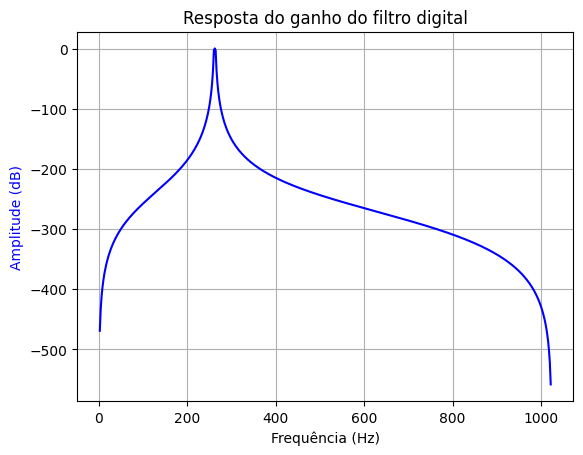

In [ ]:
# resposta em frequencia do filtro projetado
# w: frequencias da resposta
# h: saida do filtro para determinada frequencia (em dominio complexo)
w, h = signal.freqz(b, a, fs = fs)

fig, ax1 = plt.subplots()
ax1.set_title('Resposta do ganho do filtro digital')
ax1.plot(w, 20 * np.log10(abs(h)), 'b')
ax1.set_ylabel('Amplitude (dB)', color='b')
ax1.set_xlabel('Frequência (Hz)')
#ax1.set_xlim(240,280)
plt.grid()
plt.show()


Depois que confirmamos que o filtro projetado está estável e de acordo com as
especificações, vamos filtrar o sinal+ruído para extrair apenas o sinal de interesse.

In [ ]:
# aplicando o filtro no sinal com ruido
y = signal.filtfilt(b, a, x)

Plotemos agora uma amostra do sinal filtrado. Pode-se notar que o sinal de interesse foi recuperado do meio ruidoso.

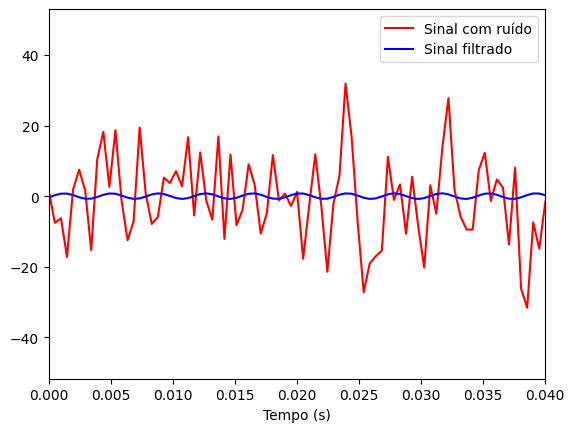

In [ ]:
# plotando o sinal com filtro e sem filtro
plt.figure()
plt.plot(t,x,'r', label='Sinal com ruído')
plt.plot(t,y,'b', label='Sinal filtrado')
plt.xlabel('Tempo (s)')
plt.legend()
plt.xlim(0,0.04)
plt.show()

In [ ]:
# tocando o som
Audio(s,rate=3000)

In [ ]:
# tocando o som
Audio(x,rate=3000)

In [ ]:
# tocando o som
Audio(y,rate=3000)

### Tutorial 2: Eliminação de informação espectral indesejada

Em diversas situações na análise de sinais e sistemas precisamos eliminar ruídos de nossos bancos de dados. Caso esses ruídos não sejam eliminados ou pelo menos minimizados, as aplicações posteriores - como ajuste de modelos de inteligência artificial - podem ficar comprometidas ou até inviabilizadas. Os filtros digitais podem ser usados para eliminar informações indesejadas de dados reais. Veremos aqui um exemplo tutorial de eliminação de ruído de microfonia de sinais de áudio.

Inicialmente, vamos carregar uma amostra de sinal de áudio contaminada por microfonia e ouvi-la. A microfonia aparece como esse zumbido constante ao longo de toda a amostra.

In [ ]:
# bibliotecas importantes para o Roteiro
from matplotlib import pyplot as plt
from scipy import signal
from scipy.fft import fft, fftfreq, irfft

import numpy as np

In [ ]:
# carregando o arquivo bird2fil do github

user = "nias-ufv"
repo = "elt576-processamento-inteligente-sinais"
diretorio = "semana-4"
arquivo = "bird2fil.wav"

url = f"https://raw.githubusercontent.com/{user}/{repo}/main/{diretorio}/{arquivo}"
!wget --no-cache --backups=1 {url}

print(f"Arquivo {arquivo} carregado com sucesso! Confira o diretório de trabalho atual.")

--2025-02-06 23:46:06--  https://raw.githubusercontent.com/nias-ufv/elt576-processamento-inteligente-sinais/main/semana-4/bird2fil.wav
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1919826 (1.8M) [audio/wav]
Saving to: ‘bird2fil.wav’

bird2fil.wav        100%[===================>]   1.83M  --.-KB/s    in 0.05s   

2025-02-06 23:46:06 (34.2 MB/s) - ‘bird2fil.wav’ saved [1919826/1919826]

Arquivo bird2fil.wav carregado com sucesso! Confira o diretório de trabalho atual.


In [ ]:
# importando a biblioteca para ler um arquivo .wav
from scipy.io import wavfile

# biblioteca para tocar audio no python (Google Colab)
from IPython.display import Audio

In [ ]:
# lendo o arquivo baixado do github
fs, bird = wavfile.read('bird2fil.wav')

# tocando o som bird2fil.wav
Audio(bird,rate=fs)

Vamos dar uma olhada no espectro do áudio a ser limpo. Pode-se ver nitidamente uma amplitude exagerada - quando comparada com o resto do espectro - em 5000 Hz. Essa é a "assinatura" espectral da microfonia.

In [ ]:
nperseg = fs/2
overlap = 0.5
f, Pxx_den = signal.welch(bird, fs,  nperseg=nperseg, noverlap=np.uint8(np.round(nperseg*overlap)))

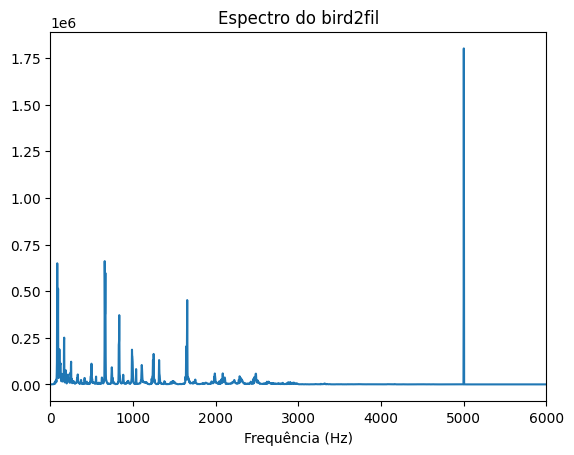

In [ ]:
plt.figure()
plt.plot(f,Pxx_den)
plt.title('Espectro do bird2fil')
plt.xlabel('Frequência (Hz)')
plt.xlim(0,6000)
plt.show()

A partir daqui temos dois caminhos para limpar o áudio: uma filtragem passa-baixas abaixo de 5000 Hz ou um filtro rejeita-faixa sintonizado em 5000 Hz. Vamos começar pelo mais simples, que é o fitro passa-baixas. O código abaixo projeta um filtro passa-baixas do tipo butterworth de quarta ordem e com frequência de corte em 4000 Hz. Confira a resposta em frequência.

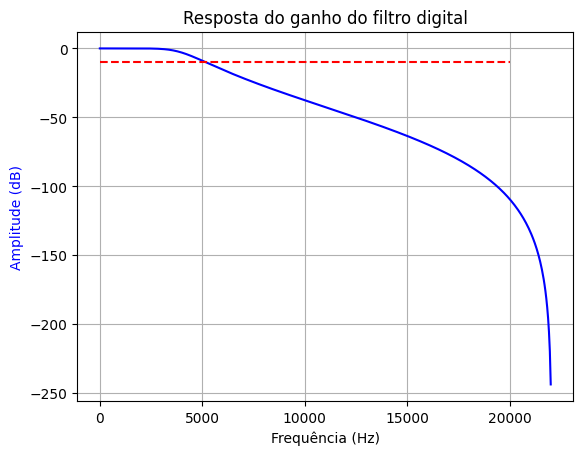

In [ ]:
# configuracao dos parametros do filtro butterworth
fbaixa = 4000
n = 4

# ajustando o filtro butterworth de ordem n e frequencia de corte fbaixa
# "B": numerador
# "A": denominador
B1, A1 = signal.butter(n, fbaixa, btype='low', output='ba', fs=fs)

# resposta em frequencia do filtro projetado
# w: frequencias da resposta
# h: saida do filtro para determinada frequencia (em dominio complexo)
w1, h1 = signal.freqz(B1, A1, fs = fs)

fig, ax1 = plt.subplots()
ax1.set_title('Resposta do ganho do filtro digital')
ax1.plot(w1, 20 * np.log10(abs(h1)), 'b')
ax1.set_ylabel('Amplitude (dB)', color='b')
ax1.set_xlabel('Frequência (Hz)')
ax1.hlines(-10,0,20000, color='r', linestyles='--')
#ax1.set_xlim(240,280)
plt.grid()
plt.show()


Vamos agora filtrar, ouvir e olhar o espectro do sinal filtrado pelo passa-baixas. A experiência sonora agora não tem microfonia significativa, porém é um pouco mais "abafada". Isso ocorre porque o passa-baixas retirou, além da microfonia em 5000 Hz, praticamente toda a informação de alta frequência acima de 4000 Hz. As informações de alta frequência são relacionadas com esse "ajuste fino" ou "brilho" da música.


In [ ]:
# aplicando o filtro no sinal com ruido
bird_filtrado = signal.filtfilt(B1, A1, bird)
t = np.arange(0,len(bird)/fs,1/fs)

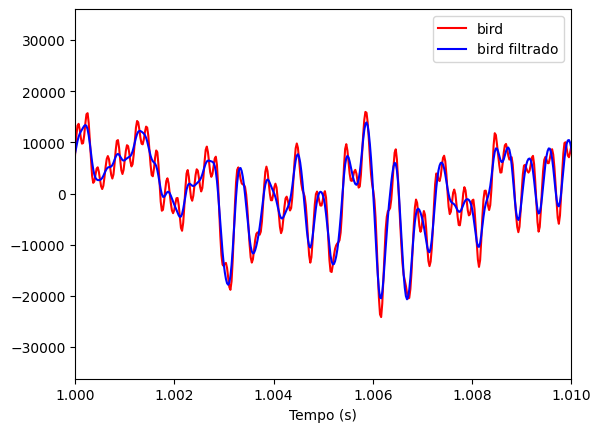

In [ ]:
# plotando o sinal com filtro e sem filtro
plt.figure()
plt.plot(t,bird,'r', label='bird')
plt.plot(t,bird_filtrado,'b', label='bird filtrado')
plt.xlabel('Tempo (s)')
plt.legend(loc='upper right')
plt.xlim(1,1.01)
plt.show()

In [ ]:
# tocando o som bird2fil.wav filtrado
Audio(bird_filtrado,rate=fs)

Como o ruído que queremos eliminar - microfonia em 5000 Hz - possui um espectro muito estreito, então podemos obter resultados mais seletivos usando um filtro rejeita-faixa. Este tipo de filtro também é chamado de filtro notch. Segue abaixo o projeto de um filtro digital rejeita-faixa, do tipo butterworth, de quarta ordem e sintonizado em torno de 5000 Hz. A resposta em frequência confirma a característica de seletividade em frequência desse filtro.


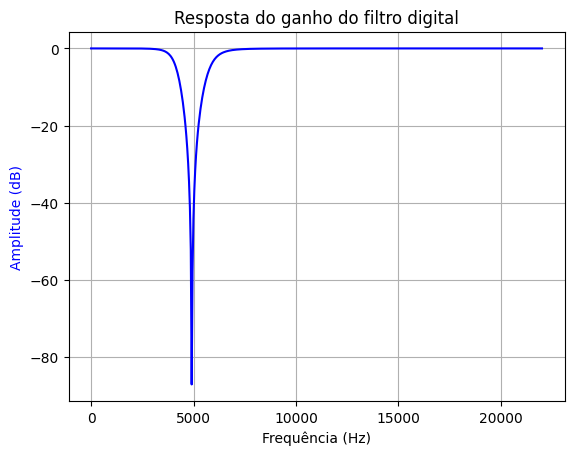

In [ ]:
# configuracao dos parametros do filtro butterworth
f1 = 4000
f2 = 6000
n = 2

# ajustando o filtro butterworth de ordem n e banda de rejeicao entre f1 e f2
# "B": numerador
# "A": denominador
B2, A2 = signal.butter(n, [f1, f2], btype='bandstop', output='ba', fs=fs)

# resposta em frequencia do filtro projetado
# w: frequencias da resposta
# h: saida do filtro para determinada frequencia (em dominio complexo)
w2, h2 = signal.freqz(B2, A2, fs = fs)

fig, ax1 = plt.subplots()
ax1.set_title('Resposta do ganho do filtro digital')
ax1.plot(w2, 20 * np.log10(abs(h2)), 'b')
ax1.set_ylabel('Amplitude (dB)', color='b')
ax1.set_xlabel('Frequência (Hz)')
#ax1.set_xlim(240,280)
plt.grid()
plt.show()

Filtremos então o áudio com esse novo filtro. Vamos verificar o espectro obtido e ouvir o resultado da filtragem. A microfonia foi minimizada sem a perda dos detalhes da música original. Uma desvantagem desse tipo de filtro é que ele demanda um pouco mais de tempo para sintonizar e possui mais coeficientes - o que o torna mais lento, computacionalmente falando.


In [ ]:
# aplicando o filtro rejeita faixa no sinal original com ruido
bird_filtrado2 = signal.filtfilt(B2, A2, bird)

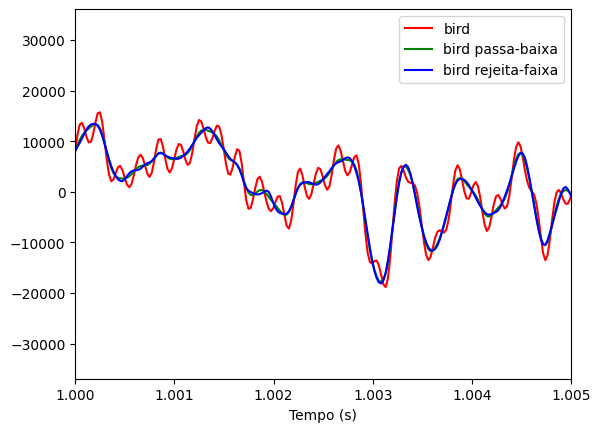

In [ ]:
# plotando o sinal com filtro e sem filtro
plt.figure()
plt.plot(t,bird,'r', label='bird')
plt.plot(t,bird_filtrado,'g', label='bird passa-baixa')
plt.plot(t,bird_filtrado2,'b', label='bird rejeita-faixa')
plt.xlabel('Tempo (s)')
plt.legend(loc='upper right')
plt.xlim(1,1.005)
#plt.xlim(9.9995,10.0005) # no detalhe
#plt.ylim(-20000,20000)
plt.show()

# tocando o som bird2fil.wav filtrado
Audio(bird_filtrado2,rate=fs)

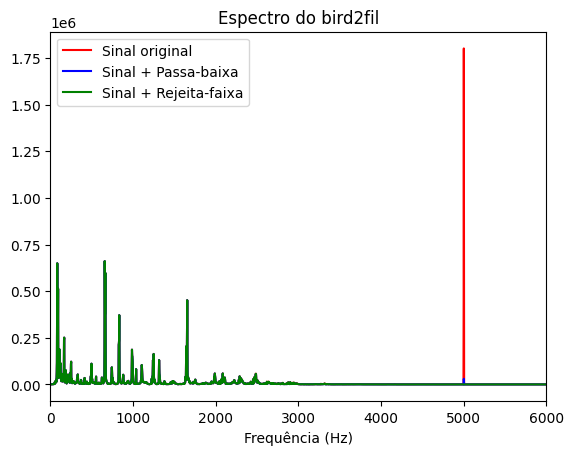

In [ ]:
f0, Pxx_den0 = signal.welch(bird, fs,  nperseg=nperseg, noverlap=np.uint8(np.round(nperseg*overlap)))
fpb, Pxx_den_pb = signal.welch(bird_filtrado, fs,  nperseg=nperseg, noverlap=np.uint8(np.round(nperseg*overlap)))
frf, Pxx_den_rf = signal.welch(bird_filtrado2, fs,  nperseg=nperseg, noverlap=np.uint8(np.round(nperseg*overlap)))

plt.figure()
plt.plot(f0,Pxx_den0, 'r', label='Sinal original')
plt.plot(fpb,Pxx_den_pb, 'b', label='Sinal + Passa-baixa')
plt.plot(frf,Pxx_den_rf, 'g', label='Sinal + Rejeita-faixa')
plt.title('Espectro do bird2fil')
plt.xlabel('Frequência (Hz)')
plt.xlim(0,6000)
plt.legend()
plt.show()

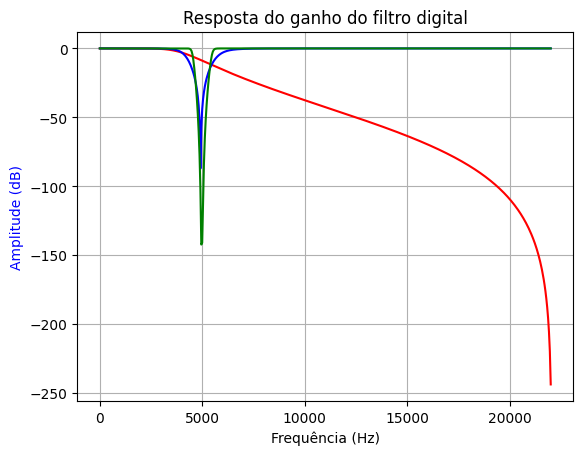

In [ ]:
# configuracao dos parametros do filtro butterworth
f1 = 4500
f2 = 5500
n = 6

# ajustando o filtro butterworth de ordem n e banda de rejeicao entre f1 e f2
# "B": numerador
# "A": denominador
B3, A3 = signal.butter(n, [f1, f2], btype='bandstop', output='ba', fs=fs)

# resposta em frequencia do filtro projetado
# w: frequencias da resposta
# h: saida do filtro para determinada frequencia (em dominio complexo)
w3, h3 = signal.freqz(B3, A3, fs = fs)

fig, ax1 = plt.subplots()
ax1.set_title('Resposta do ganho do filtro digital')
ax1.plot(w1, 20 * np.log10(abs(h1)), 'r')
ax1.plot(w2, 20 * np.log10(abs(h2)), 'b')
ax1.plot(w3, 20 * np.log10(abs(h3)), 'g')
ax1.set_ylabel('Amplitude (dB)', color='b')
ax1.set_xlabel('Frequência (Hz)')
#ax1.set_xlim(240,280)
plt.grid()
plt.show()

In [ ]:
# aplicando o filtro rejeita faixa no sinal original com ruido
bird_filtrado3 = signal.filtfilt(B3, A3, bird)

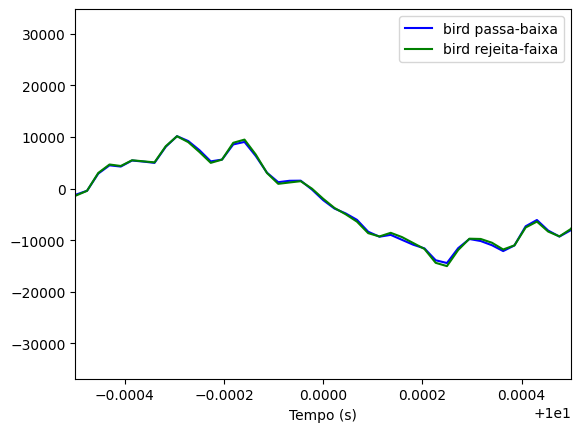

In [ ]:
# plotando o sinal com filtro e sem filtro
plt.figure()
#plt.plot(t,bird,'r', label='bird')
plt.plot(t,bird_filtrado2,'b', label='bird passa-baixa')
plt.plot(t,bird_filtrado3,'g', label='bird rejeita-faixa')
plt.xlabel('Tempo (s)')
plt.legend(loc='upper right')
#plt.xlim(9.95,10.05)
plt.xlim(9.9995,10.0005) # no detalhe
#plt.ylim(-20000,20000)
plt.show()

# tocando o som bird2fil.wav filtrado
Audio(bird_filtrado3,rate=fs)